In [1]:
import os
import tempfile

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import rcParams
from matplotlib import cm, colors
import scanpy as sc
import pandas as pd
import seaborn as sb
import scipy as sp
import numpy as np
import torch
from rich import print


# Define the path to the directory you want to change to
new_directory = '/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/Human_scVI_single'

# Use os.chdir() to change the working directory
os.chdir(new_directory)

In [2]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import rcParams
from matplotlib import cm, colors

# Define a nice color map for gene expression
colors2 = plt.cm.PuRd(np.linspace(0, 1, 128))  # Use PuRd color map for deep red/purple color
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))  # Greys for low values
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [4]:
plt.rcParams['figure.figsize']=(5,5) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=True, fontsize=12) #color_map=mymap2)
sc.settings.figdir = '/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/Human_scVI_single/figures_all/'
sc.logging.print_header()

scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.26.4 scipy==1.11.4 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.12


# ASTROCYTE SUBSETTING

In [15]:
sc.pp.filter_cells(adata_ast, min_genes=200)
sc.pp.filter_genes(adata_ast, min_cells=10)
print("Dimensions of adata_ast:", adata_ast.shape)

filtered out 2393 genes that are detected in less than 10 cells


Dimensions of adata_ast:
(39306, 26647)

In [17]:
sc.pp.neighbors(adata_ast, use_rep = 'X_scVI', n_neighbors=20)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:33)


In [18]:
sc.tl.umap(adata_ast, min_dist=0.5)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


In [19]:
sc.tl.leiden(adata_ast, resolution=0.5, key_added='leiden_AS_r0.5')
sc.tl.leiden(adata_ast, resolution=1, key_added='leiden_AS_r1')
sc.tl.leiden(adata_ast, resolution=1.5, key_added='leiden_AS_r1.5')

running Leiden clustering


/tmp/ipykernel_2431833/3734201981.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_ast, resolution=0.5, key_added='leiden_AS_r0.5')


    finished: found 10 clusters and added
    'leiden_AS_r0.5', the cluster labels (adata.obs, categorical) (0:00:34)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden_AS_r1', the cluster labels (adata.obs, categorical) (0:00:51)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden_AS_r1.5', the cluster labels (adata.obs, categorical) (0:00:33)


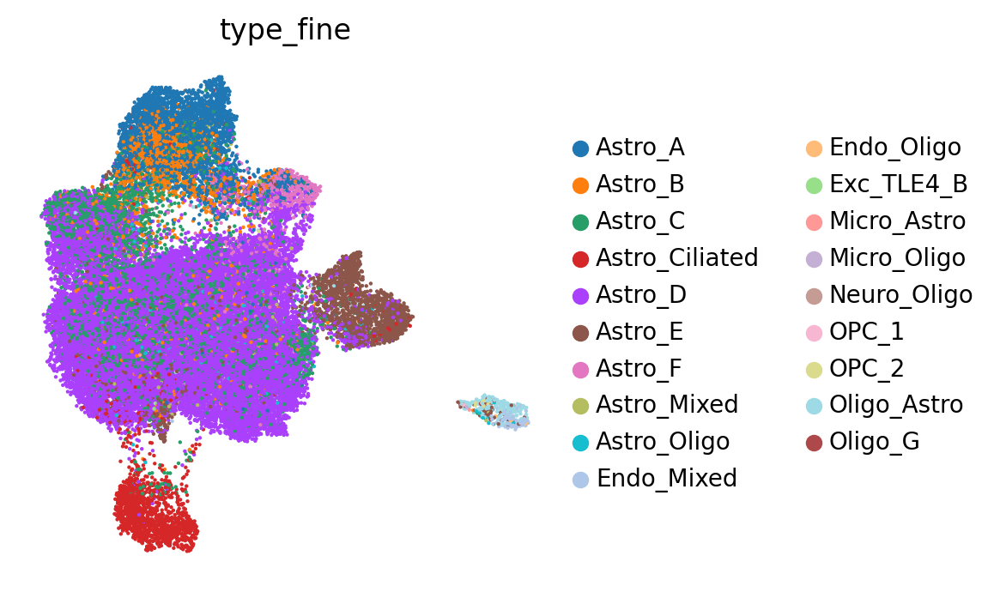

In [24]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ast, color=['type_fine'], legend_fontsize =float(10) , wspace=0.6, s=10,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1)# save=today+'_Macnair_fine_type.png' )

In [26]:
MS_AL = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='AL'],n_obs=3025,copy=True).obs_names
MS_NAWM = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='NAWM'],n_obs=3025,copy=True).obs_names
MS_CAL = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='CAL'],n_obs=3025,copy=True).obs_names
hs_WM = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='WM'],n_obs=3025,copy=True).obs_names
MS_RL = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='RL'],n_obs=3025,copy=True).obs_names
MS_CIL = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='CIL'],n_obs=3025,copy=True).obs_names

In [28]:
adata_subsample = adata_ast[list(hs_WM) + list(MS_AL) + list(MS_NAWM) + list(MS_CAL) + list(MS_RL) +
                                list(MS_CIL) ].copy()

sc.tl.embedding_density(adata_subsample, basis='umap', groupby='lesion_type')

computing density on 'umap'
--> added
    'umap_density_lesion_type', densities (adata.obs)
    'umap_density_lesion_type_params', parameter (adata.uns)


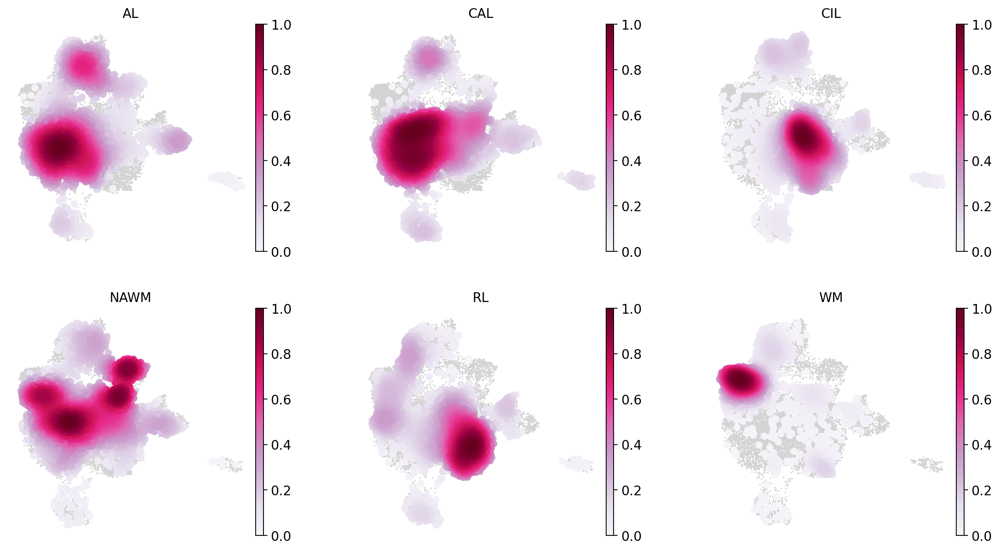

In [29]:
sc.pl.embedding_density(adata_subsample, basis='umap',  key='umap_density_lesion_type', 
                        color_map='PuRd', wspace=0.3, bg_dotsize = 8, frameon= False, ncols=3)

In [30]:
common_innate_immunity_human = ['IFI47', 'IIGP1', 'MDFIC', 'TOP2A', 'DYNLT1A', 'LGALS1', 
                                'CXCL10', 'OASL1', 'ZBP1', 'DHX58', 'TRIM25', 'RSAD2', 'SLFN9', 
                                'OAS1A', 'IFITM2', 'BCL3', 'IFI27L2A', 'OASL2',  'IRF7', 'IFIT1', 
                                'BST2', 'ISG15', 'IFIT3B', 'IFIT3', 'IFITM3', 'RTP4']

sc.tl.score_genes(adata_ast, common_innate_immunity_human, score_name='common_innate_immunity_human')

computing score 'common_innate_immunity_human'
       'OASL2', 'IFIT3B'],
      dtype='object')
    finished: added
    'common_innate_immunity_human', score of gene set (adata.obs).
    500 total control genes are used. (0:00:00)


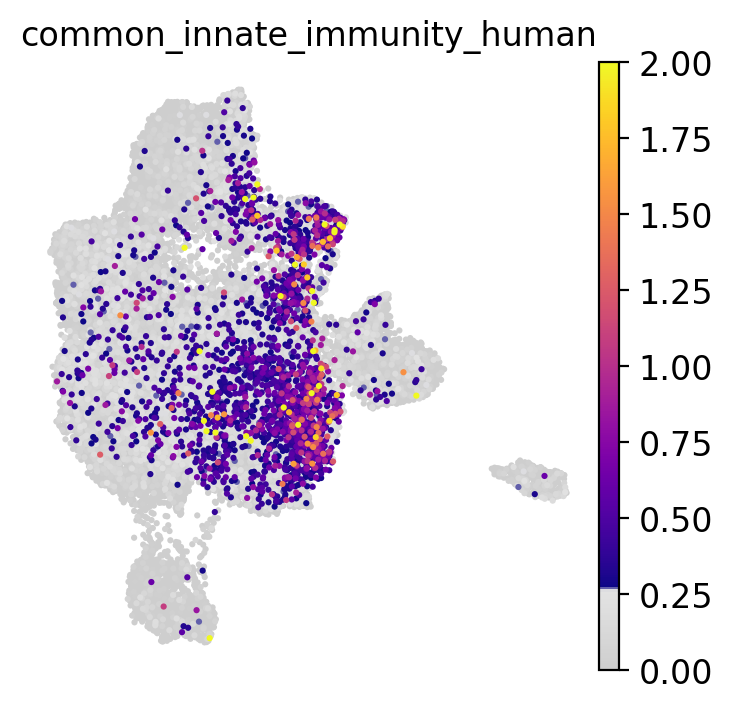

In [31]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ast, color=['common_innate_immunity_human'],legend_fontsize =float(12), \
           cmap=mymap2, vmin=0, vmax=2, 
           legend_fontweight= 'normal', frameon= False, s=20)

In [24]:
IRAS1=['Ccl2','Ccl20','Csf3','Cxcl1','Cxcl2','Cxcl3','Cxcl5','Fth1','Pdcd5','Pdlim4','Pitx3',
       'Psme2','Serpine1','Sod2','Tnfaip6']

IRAS1_hs = [gene.upper() for gene in IRAS1]


IRAS2=['B2m','Calr','Carhsp1','Ccl2','Cd47','Fth1','Icam1','Lap3','Nfkbia','Nnmt','Pdcd5','Pfn1',
       'Pkm','Prelid1','Psme2','Sod2','Tmsb10','Vcam1'] #Leng et.al.2022

IRAS2_hs = [gene.upper() for gene in IRAS2]

In [33]:
sc.tl.score_genes(adata_ast, IRAS1_hs, score_name='IRAS1')
sc.tl.score_genes(adata_ast, IRAS2_hs, score_name='IRAS2')

computing score 'IRAS1'
    finished: added
    'IRAS1', score of gene set (adata.obs).
    648 total control genes are used. (0:00:02)
computing score 'IRAS2'
    finished: added
    'IRAS2', score of gene set (adata.obs).
    449 total control genes are used. (0:00:02)


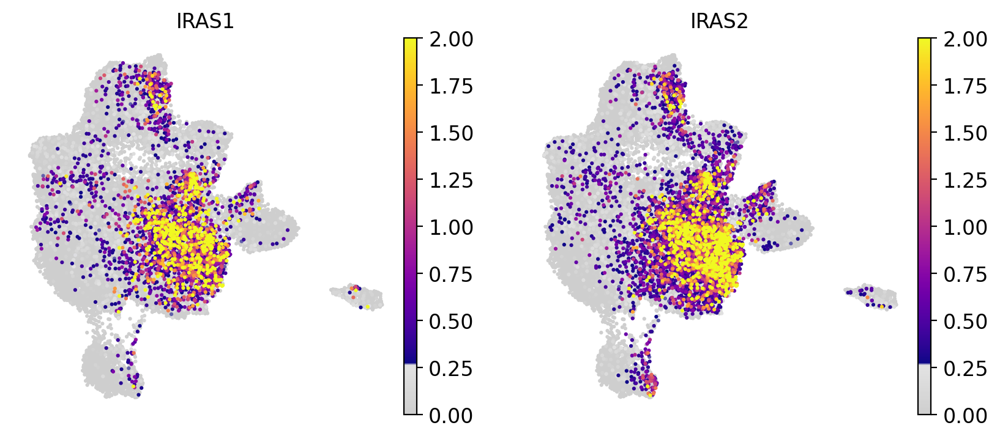

In [34]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ast, color=['IRAS1', 'IRAS2'],legend_fontsize =float(12), \
           cmap=mymap2, vmin=0, vmax=2, 
           legend_fontweight= 'normal', frameon= False, s=20)

In [36]:
sc.tl.dendrogram(adata_ast, 'leiden_AS_r1')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_AS_r1']`


In [37]:
#Calculate marker genes check for 100 use raw data for markers
sc.tl.rank_genes_groups(adata_ast, groupby='leiden_AS_r1', key_added='rank_genes_leiden_1', 
                        method='t-test_overestim_var', use_raw=True)

ranking genes
    finished: added to `.uns['rank_genes_leiden_1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:54)


/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/edgeR/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:452: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (


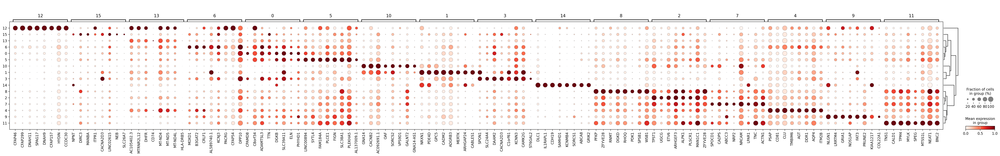

In [38]:
sc.pl.rank_genes_groups_dotplot(adata_ast, n_genes=8, key='rank_genes_leiden_1',
                               standard_scale='var') #save='_scVI_ctrl_annotated.png')

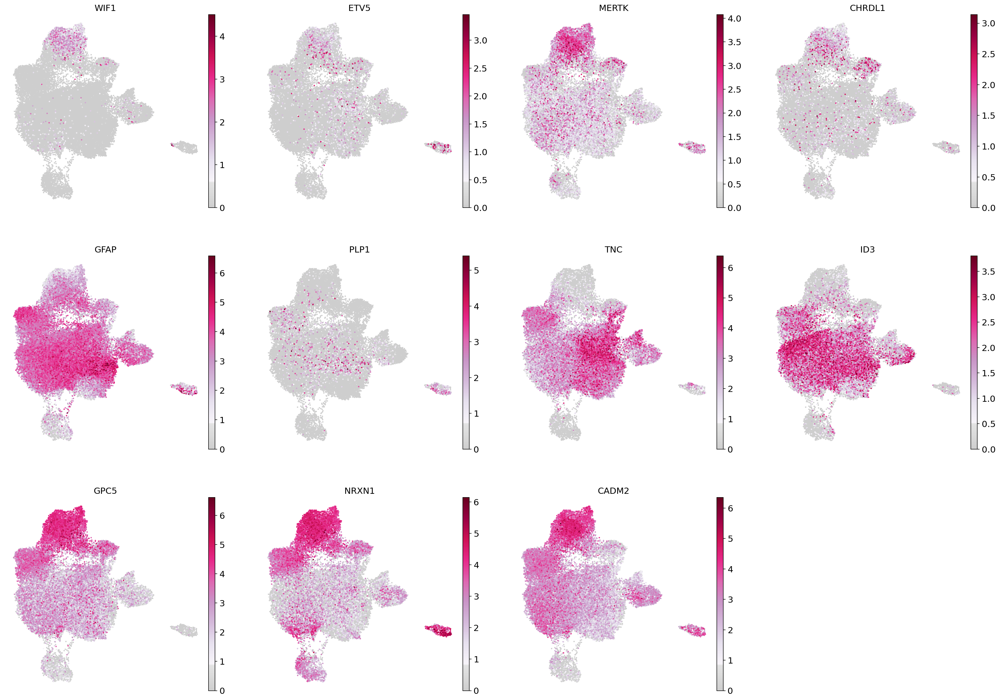

In [48]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
import scanpy as sc


# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

# Define a nice color map for gene expression
colors2 = plt.cm.PuRd(np.linspace(0, 1, 128))  # Use PuRd color map for deep red/purple color
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))  # Greys for low values
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)


sc.pl.embedding(
    adata_ast,
    basis='X_umap',
    color=["WIF1", "ETV5", "MERTK", "CHRDL1", "GFAP", 'PLP1', 'TNC', 'ID3', 'GPC5', 'NRXN1', 'CADM2'],
    frameon=False,
    ncols=4,
    s=20,
    use_raw=False,
    color_map=mymap,
    layer='log1p_norm'
)

In [58]:
cluster_1_annotation = {
    '0': 'Astro_C',
    '1': 'Astro_D',
    '2': 'Astro_E',
    '3': 'Astro_A',
    '4': 'Astro_E',
    '5': 'Astro_C',
    '6': 'Astro_C',
    '7': 'Astro_E',
    '8': 'Astro_E',
    '9': 'Astro_F',
    '10': 'Astro_B',
    '11': 'Astro_E',
    '12': 'Ciliated',
    '13': 'Astro_C',
    '14': 'Mixed',
    '15': 'Astro_C'
}

adata_ast.obs['cluster_annotation'] = adata_ast.obs['leiden_AS_r1'].map(cluster_1_annotation).astype('category')

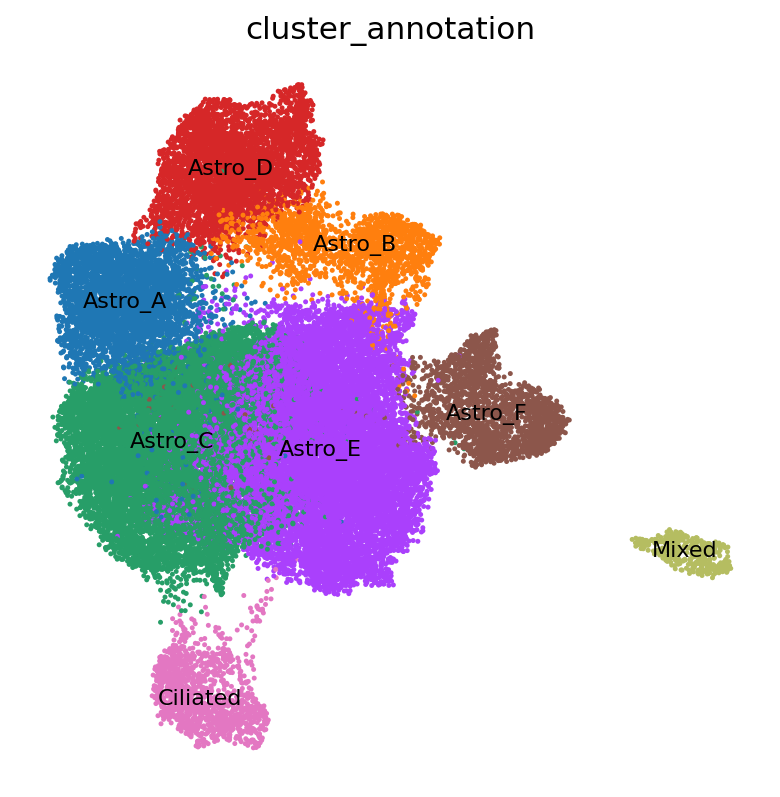

In [60]:
sc.pl.umap(adata_ast, color=['cluster_annotation'], legend_fontsize =float(10),
        legend_fontweight= 'normal', legend_loc='on data', s=20, frameon= False)

In [61]:
adata_ast.write('./scVI_mdata_AS_working.h5ad')

In [25]:
today='_Dec18'

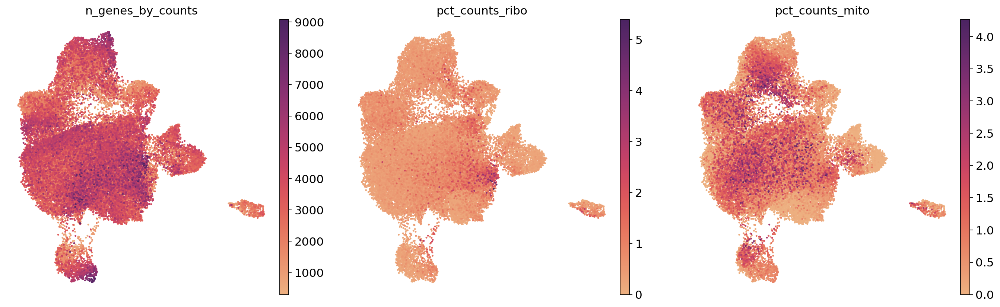

In [9]:
# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

sc.pl.umap(adata_ast, color=['n_genes_by_counts', 
                         'pct_counts_ribo','pct_counts_mito'],
           cmap='flare',ncols=3, s=20, frameon=False,
          save='_hs_scVI_integration_QC_plots_AST_reduced.png')

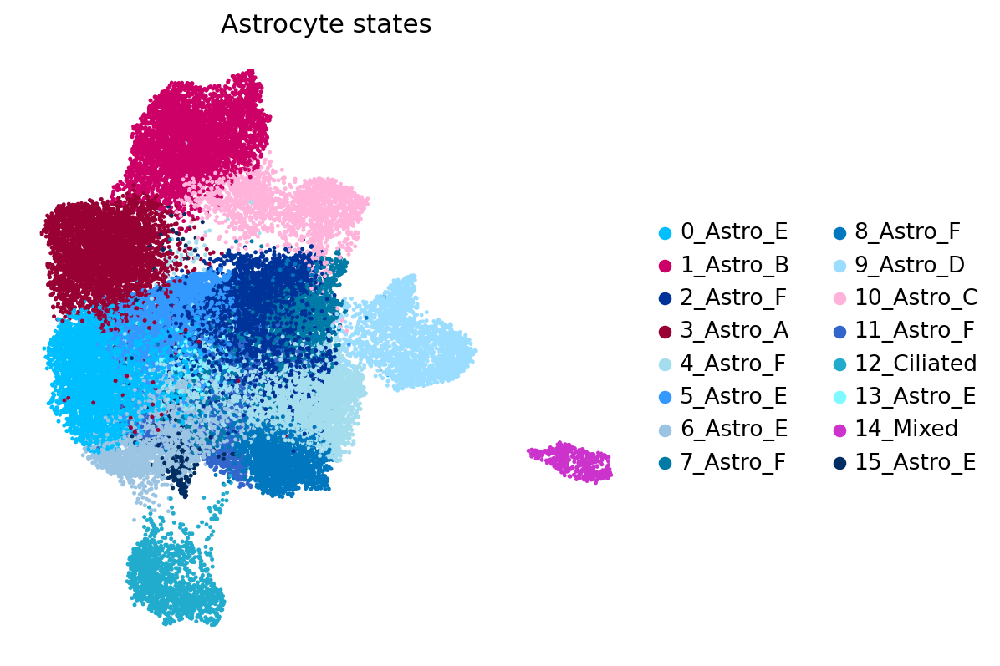

In [15]:
cluster_color = {
    '0_Astro_E': '#00bfff',
    '1_Astro_B': '#cc0066',
    '2_Astro_F': '#003399',
    '3_Astro_A': '#990033',
    '4_Astro_F': '#a4dded',  # Light blue
    '5_Astro_E': '#3399ff',  # Medium blue
    '6_Astro_E': '#9bc4e2',  # Darker blue
    '7_Astro_F': '#007ba7',  # Very light blue
    '8_Astro_F': '#0077be',  # Sky blue
    '9_Astro_D': '#9bddff',
    '10_Astro_C': '#ffb3db',
    '11_Astro_F': '#3366cc',  # Royal blue
    '12_Ciliated': '#21abcd',
    '13_Astro_E': '#7df9ff',  # Very light blue
    '14_Mixed': '#cc33cc',
    '15_Astro_E': '#002e63',  # Medium blue
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ast, color=['leiden_1_annotation'], legend_fontsize =float(12) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color,s=20,
           legend_fontweight= 'bold', title='Astrocyte states', frameon= False , 
           legend_fontoutline=1, save=today+'_human_scVI_integration_AST_cell_type.png')

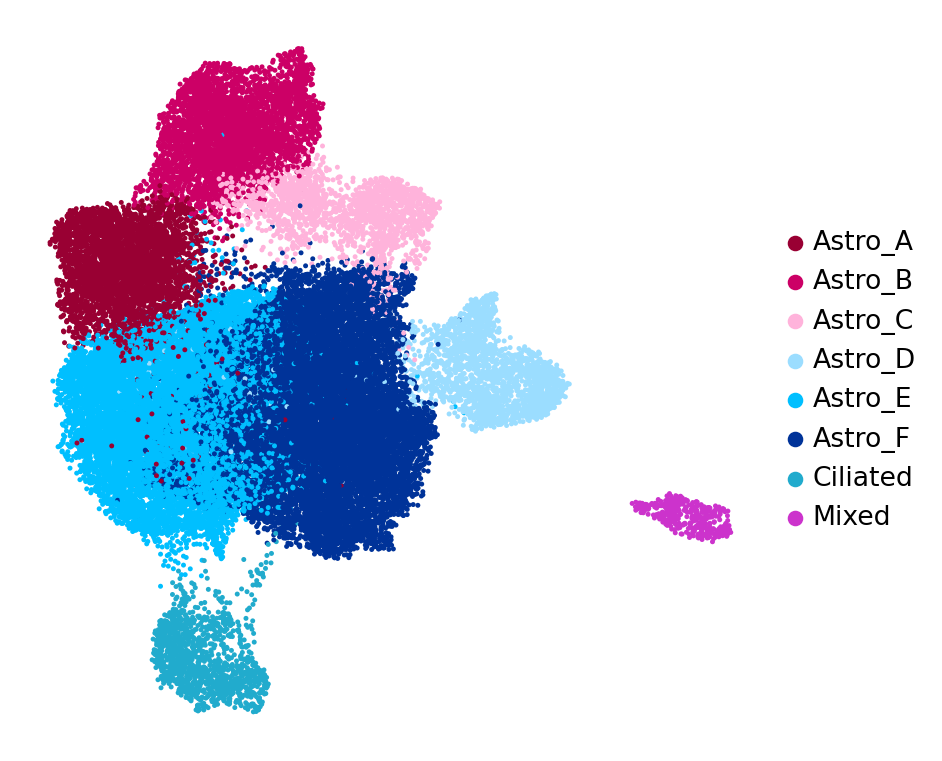

In [27]:
cluster_color = {
    'Astro_A': '#990033',
    'Astro_B': '#cc0066',
    'Astro_C': '#ffb3db',
    'Astro_D': '#9bddff',
    'Astro_E': '#00bfff',
    'Astro_F': '#003399',
    'Ciliated': '#21abcd',
    'Mixed': '#cc33cc',
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ast, color=['cluster_annotation'], legend_fontsize =float(12) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color,s=20,
           legend_fontweight= 'bold', title='', frameon= False , 
           legend_fontoutline=1, save=today+'_human_scVI_integration_AST_cell_type.png')

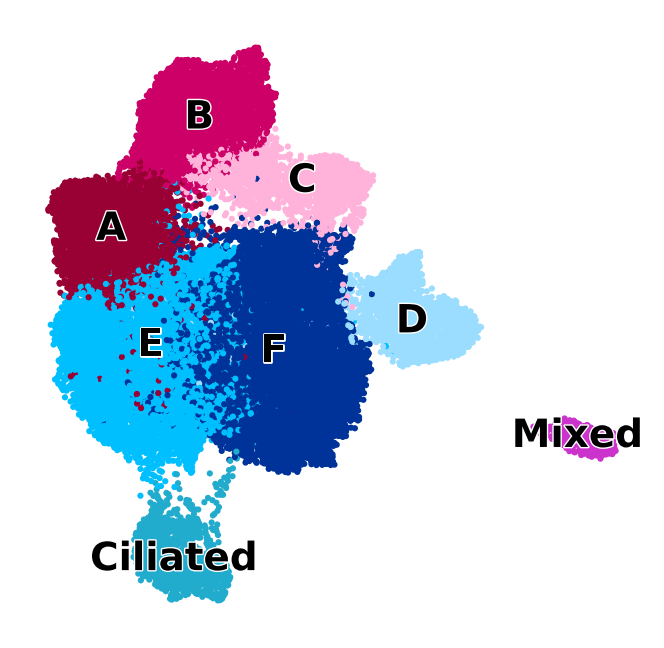

In [27]:
cluster_color = {
    'A': '#990033',
    'B': '#cc0066',
    'C': '#ffb3db',
    'D': '#9bddff',
    'E': '#00bfff',
    'F': '#003399',
    'Ciliated': '#21abcd',
    'Mixed': '#cc33cc',
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ast, color=['cluster_annotation_lettered'], legend_fontsize =float(14) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color,s=20, legend_loc='on data',
           legend_fontweight= 'bold', title='', frameon= False , 
           legend_fontoutline=1, save=today+'_human_scVI_integration_AST_cell_type_lettered.png')

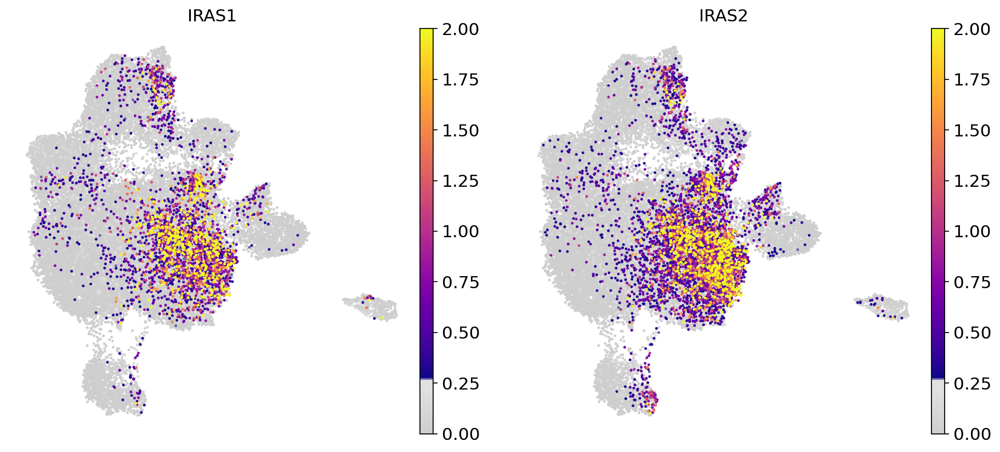

In [18]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ast, color=['IRAS1', 'IRAS2'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20,
          save=today+'_IRAS_scVI_AST.png')

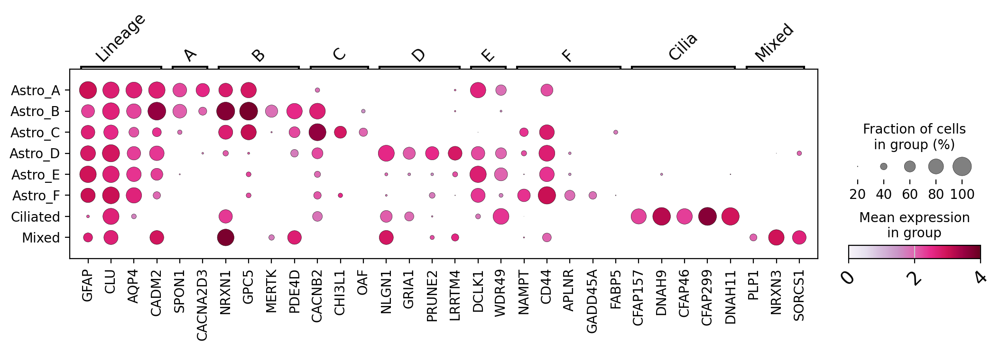

In [14]:
# Known marker genes with mouse gene names
marker_genes_human = {
    'Lineage': ['GFAP','CLU', 'AQP4', 'CADM2'],
    'A': ['SPON1', 'CACNA2D3'], 
    'B': ['NRXN1', 'GPC5', 'MERTK', 'PDE4D'],
    'C': ['CACNB2', 'CHI3L1', 'OAF'],
    'D': ['NLGN1', 'GRIA1', 'PRUNE2', 'LRRTM4'],
    'E': ['DCLK1', 'WDR49'],
    'F': ['NAMPT', 'CD44', 'APLNR', 'GADD45A', 'FABP5'],
    'Cilia': ['CFAP157', 'DNAH9', 'CFAP46', 'CFAP299', 'DNAH11'],
    'Mixed': ['PLP1', 'NRXN3', 'SORCS1']
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes_human.values() for gene in genes]

# Correct var_group_positions based on marker_genes
var_group_positions = []
start = 0
for genes in marker_genes_human.values():
    end = start + len(genes) - 1  # Calculate the end index for the group
    var_group_positions.append((start, end))  # Add the start and end index to var_group_positions
    start = end + 1  # Update the start index for the next group

# Plot the dotplot with the corrected parameters
ax = sc.pl.dotplot(
        adata_ast,
        groupby="cluster_annotation",
        var_names=all_genes,
        use_raw=False,
        log=False,
        dendrogram=False,
        layer='log1p_norm',
        var_group_positions=var_group_positions,
        var_group_labels=list(marker_genes_human.keys()),
        var_group_rotation=45,
        swap_axes=False,  # Keep genes on the x-axis and cell types on the y-axis
        cmap='PuRd',  # Choose a color map for dot intensities
        color_map='PuRd',  # Choose a color map for dot colors
        figsize=(10, 8),  # Set the figure size
        show=False,
        vmax=4,
        dot_min=0.19,  # Adjust the minimum dot size
        mean_only_expressed=True,
        expression_cutoff=1,
    )

# Get the current Axes instance
ax = plt.gca()

# Set the font size and rotation angle for the x-axis (gene labels)
plt.setp(ax.get_xticklabels(), fontsize=14, rotation=45)

# Set the font size for the y-axis (cell type labels)
ax.set_ylabel(ax.get_ylabel(), fontsize=16)

# Set the font size for the x-axis (gene labels)
ax.set_xlabel(ax.get_xlabel(), fontsize=16)

# Adjust spacing between y-axis ticks
plt.subplots_adjust(left=0.00001)  # Adjust left margin to reduce space between dots: smaller gives more space
#plt.subplots_adjust(bottom=0.5) 
plt.subplots_adjust(top=0.4) # adjust space up and down between dots, bigger makes bigger space

# Save the plot as a PNG file
plt.savefig('./figures_AST/Human_dotplot_AST_markers.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

In [16]:
# Define the desired order of lesion types
lesion_order = ["WM", "NAWM", "AL", "CAL", "CIL", "RL"]

# Convert lesion_type column to categorical with the specified order
adata_ast.obs['lesion_type'] = pd.Categorical(
    adata_ast.obs['lesion_type'], 
    categories=lesion_order, 
    ordered=True
)

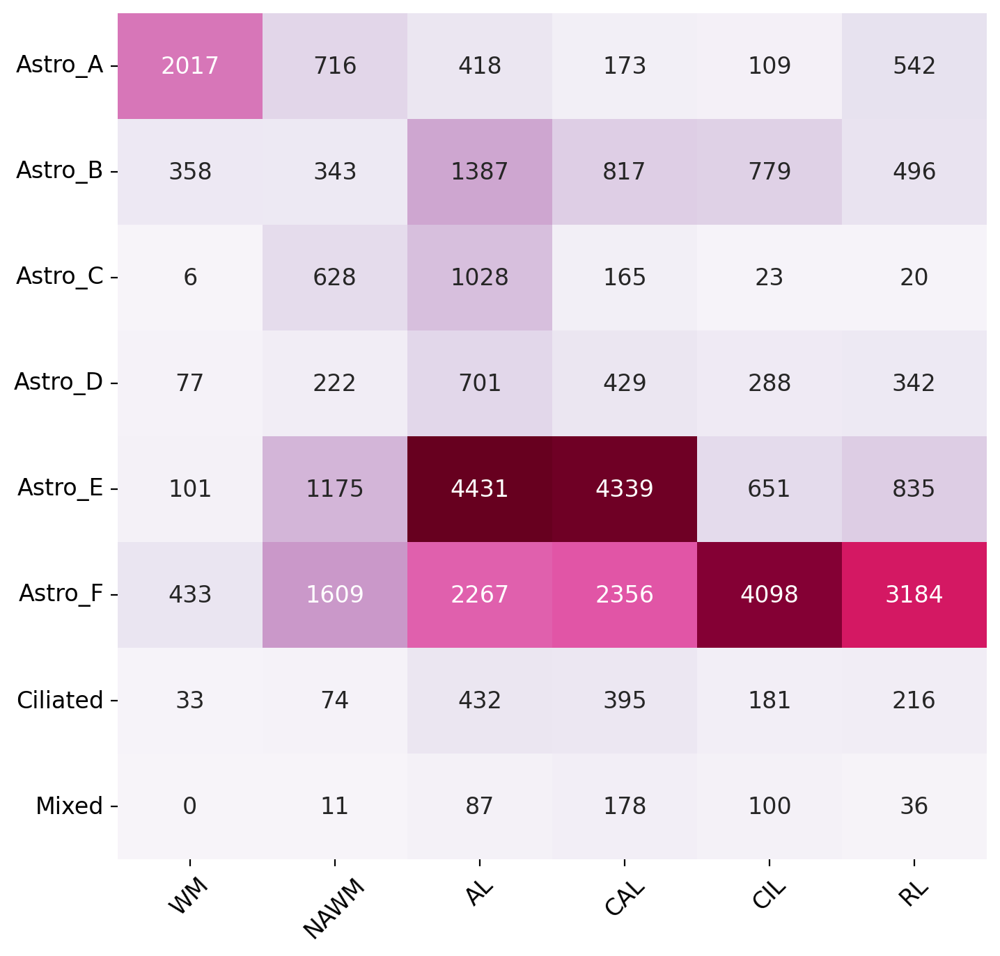

In [17]:
crosstab_df = pd.crosstab(adata_ast.obs.cluster_annotation, adata_ast.obs.lesion_type)

# Create the heatmap with integer annotations
plt.figure(figsize=(8, 8))  # Adjust the figure size to make it more square
ax = sb.heatmap(crosstab_df, cmap="PuRd", annot=True, fmt="d", cbar=False, square=False)

# Remove grid lines
ax.grid(False)

# Remove axis labels (titles)
ax.set_xlabel(None)
ax.set_ylabel(None)

# Rotate tick labels for better visibility
ax.tick_params(axis='x', rotation=45)
ax.tick_params(axis='y', rotation=0)

# Alternatively, for vector graphics format
plt.savefig('./figures_AST/crosstab_cluster_annotation_vs_lesion_AST.png', dpi=300, bbox_inches='tight')

# Show the heatmap
plt.show()

In [30]:
adata_ast.obs['lesion_type'].value_counts()

lesion_type
AL      10751
CAL      8852
CIL      6229
RL       5671
NAWM     4778
WM       3025
Name: count, dtype: int64

In [31]:
MS_AL = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='AL'],n_obs=3025,copy=True).obs_names
MS_NAWM = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='NAWM'],n_obs=3025,copy=True).obs_names
MS_CAL = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='CAL'],n_obs=3025,copy=True).obs_names
hs_WM = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='WM'],n_obs=3025,copy=True).obs_names
MS_RL = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='RL'],n_obs=3025,copy=True).obs_names
MS_CIL = sc.pp.subsample(adata_ast[adata_ast.obs['lesion_type']=='CIL'],n_obs=3025,copy=True).obs_names

In [32]:
adata_subsample = adata_ast[list(hs_WM) + list(MS_AL) + list(MS_NAWM) + list(MS_CAL) + list(MS_RL) +
                                list(MS_CIL) ].copy()

sc.tl.embedding_density(adata_subsample, basis='umap', groupby='lesion_type')

computing density on 'umap'
--> added
    'umap_density_lesion_type', densities (adata.obs)
    'umap_density_lesion_type_params', parameter (adata.uns)


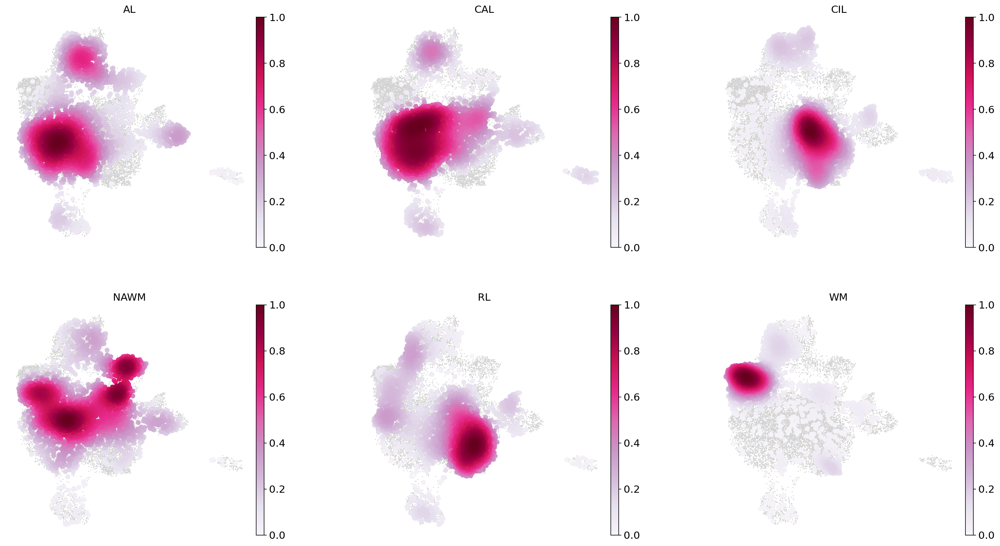

In [33]:
sc.pl.embedding_density(adata_subsample, basis='umap',  key='umap_density_lesion_type', 
                        color_map='PuRd', wspace=0.3, bg_dotsize = 8, frameon= False, ncols=3, save=today+'density_plot.png')